<a href="https://colab.research.google.com/github/Bparui/Stereo-Reconstruction/blob/main/stereo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
from mpl_toolkits.mplot3d import Axes3D
import struct
import pandas as pd
import yaml
from scipy import ndimage, misc

In [ ]:
#Middlebury dataset -  piano-perfectuhjbn

cam0 =np.array([[2852.758,0,1424.085,],[0,2852.758,953.053],[0,0,1]])
#cam1=[2852.758 0 1549.445; 0 2852.758 953.053; 0 0 1]
doffs=125.36
baseline=178.089
width=2828
height=1924
ndisp=260
isint=0
vmin=32
vmax=224
dyavg=0.408
dymax=1.923

In [ ]:
disp_num = vmax - vmin
window = 5
distort = np.zeros((5,1)).astype(np.float32)
T = (np.array([baseline,0,0])).T
R = np.identity(3)
R1,R2,P1,P2,Q,_,_ = cv.stereoRectify(cam0,distort,cam0,distort,(height,width),R,T)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/stereo/


/content/drive/MyDrive/stereo


In [ ]:

from google.colab.patches import cv2_imshow

(1924, 2828, 3)
(1924, 2828, 3)
(1924, 2828)
(1924, 2828)


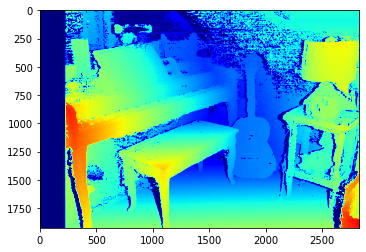

In [ ]:
img_1 = cv.imread('img1.png')
print(img_1.shape)
img_2 = cv.imread('img2.png')
print(img_2.shape)

stereo = cv.StereoSGBM_create(minDisparity=vmin, numDisparities=disp_num, preFilterCap=1, blockSize=5, uniquenessRatio=2, speckleWindowSize=50, speckleRange =2, disp12MaxDiff =1, P1 = 8*3*window**2, P2 = 32*3*window**2,mode = 4)
disparity = stereo.compute(img_1,img_2).astype(np.float32)
print(disparity.shape)
#disparity = ndimage.median_filter(disparity, size=15)
print(disparity.shape)
disparity = cv.bilateralFilter(disparity,9,75,75)
plt.imshow(disparity,"jet")
plt.show()

In [ ]:
point_cloud = cv.reprojectImageTo3D(disparity,Q)
colors = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
print(colors.shape) 

mask = disparity > disparity.min()
cloud = point_cloud[mask]
colors = img_1[mask]
cv2_imshow(colors)
print(cloud.shape)
print(colors.shape)


(1924, 2828, 3)


(5441063, 3)
(5441063, 3)


'print(mask.shape)\nx=point_cloud[:,:,0]\nx = x[np.where(mask== True)[0],np.where(mask== True)[1]].flatten().reshape(-1,1)\nprint(x.shape)\ny=point_cloud[:,:,1]\ny = y[np.where(mask== True)[0],np.where(mask== True)[1]].flatten().reshape(-1,1)\nz=point_cloud[:,:,2]\nz = z[np.where(mask== True)[0],np.where(mask== True)[1]].flatten().reshape(-1,1)\ncloud_mat = np.hstack((x,y,z))\nrgb_map = img_1[mask]\nprint(rgb_map.shape)\nrgb_map = rgb_map.reshape(-1,1)\nrgb_map = np.hstack((rgb_map,rgb_map,rgb_map))\nprint(rgb_map.shape)\nprint(cloud_mat.shape[0],rgb_map.shape[0])\n  '

In [ ]:
def constr_scene(cloud,color,name):
    color = color.reshape(-1, 3)
    fid = open(name+'.ply','wb')
    fid.write(bytes('ply\n', 'utf-8'))
    fid.write(bytes('format binary_little_endian 1.0\n', 'utf-8'))
    fid.write(bytes('element vertex %d\n'%cloud.shape[0], 'utf-8'))
    fid.write(bytes('property float x\n', 'utf-8'))
    fid.write(bytes('property float y\n', 'utf-8'))
    fid.write(bytes('property float z\n', 'utf-8'))
    fid.write(bytes('property uchar red\n', 'utf-8'))
    fid.write(bytes('property uchar green\n', 'utf-8'))
    fid.write(bytes('property uchar blue\n', 'utf-8'))
    fid.write(bytes('end_header\n', 'utf-8'))

    # Write 3D points to .ply file
    print(cloud.shape[0])
    for i in range(0,cloud.shape[0]):
      fid.write(bytearray(struct.pack("fffccc",cloud[i,0],cloud[i,1],cloud[i,2],color[i,2].tobytes(),color[i,1].tobytes(),color[i,0].tobytes())))
    fid.close()

In [ ]:
constr_scene(cloud,colors,'pianonow')

4613923
